In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import shutil
import matplotlib.pyplot as plt
import numpy as np

In [4]:
import librosa
import soundfile as sf

import os

# Mevcut çalışma dizinini alır
current_directory = os.getcwd()

print("Mevcut çalışma dizini:", current_directory)
mehmetkocoglu = current_directory + "\\mehmetkocoglu"
print(mehmetkocoglu)


Mevcut çalışma dizini: C:\Users\tahat\deeplearning-workspace\speaker-recognition
C:\Users\tahat\deeplearning-workspace\speaker-recognition\mehmetkocoglu


In [5]:
from IPython.display import display, Audio

# Function to play audio file
def play_audio(audio_path):
    display(Audio(filename=audio_path))

# Play a specific combined audio file
speaker_folder = "ses"
audio_path = os.path.join(mehmetkocoglu, f"{speaker_folder}.wav")
print(f"Click the play button to listen: {audio_path}")
play_audio(audio_path)

Click the play button to listen: C:\Users\tahat\deeplearning-workspace\speaker-recognition\mehmetkocoglu\ses.wav


C:\Users\tahat\AppData\Local\Temp\ipykernel_10248\431207453.py:19: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)


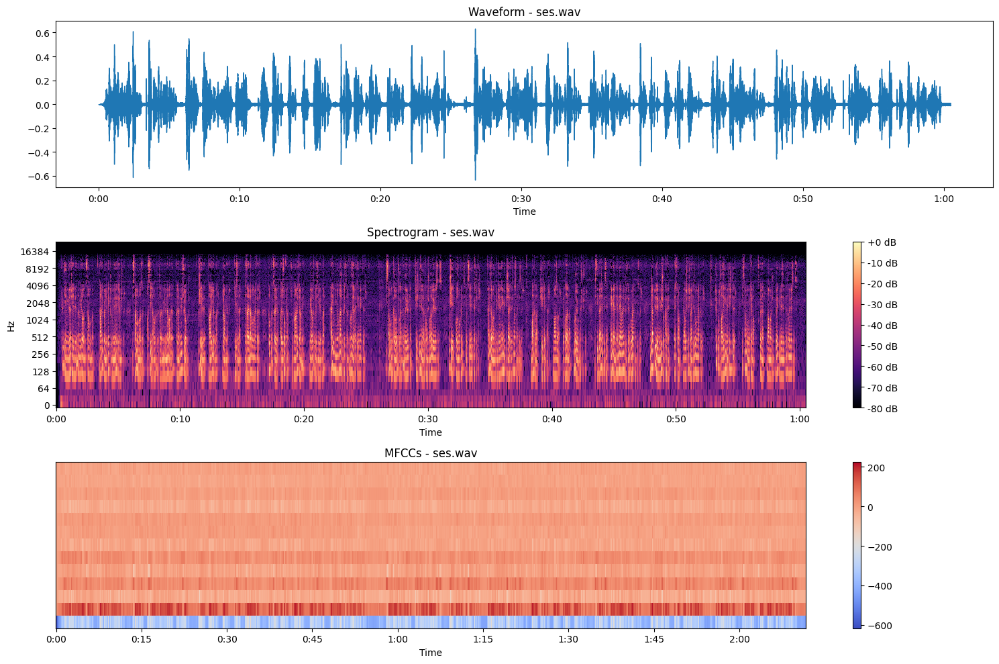

In [8]:
import librosa.display

# Function to plot the waveform, spectrogram, and MFCCs
def plot_audio_features(audio_path):
    # Load audio file
    y, sr = librosa.load(audio_path, sr=None)

    # Extract speaker name from the file path
    speaker_name = os.path.basename(audio_path).split('_')[0]

    # Plot the waveform
    plt.figure(figsize=(15, 10))
    plt.subplot(3, 1, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title(f'Waveform - {speaker_name}')

    # Plot the spectrogram
    plt.subplot(3, 1, 2)
    D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram - {speaker_name}')

    # Plot the MFCCs
    plt.subplot(3, 1, 3)
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    librosa.display.specshow(mfccs, x_axis='time')
    plt.colorbar()
    plt.title(f'MFCCs - {speaker_name}')

    plt.tight_layout()
    plt.show()

# Paths to the combined audio files
audio_paths = [
    'mehmetkocoglu/ses.wav'
]

# Plot features for each audio file
for audio_path in audio_paths:
    plot_audio_features(audio_path)

In [12]:
from sklearn.preprocessing import StandardScaler
def extract_features_from_audio(audio_path):
    features = []
    audio, sr = librosa.load(audio_path, sr=None, duration=1)
    mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=13)
    
    # Normalize MFCC features
    mfccs = StandardScaler().fit_transform(mfccs)
    
    features.append(mfccs.T)
    
    return np.array(features)

# Örnek kullanım:
audio_path = "mehmetkocoglu/ses.wav"  # Ses dosyanızın yolunu buraya girin
X = extract_features_from_audio(audio_path)

In [14]:
import numpy as np

# Tüm özellikleri yazdırmak için sınırı kaldır
np.set_printoptions(threshold=np.inf)

# X'in tüm özelliklerini yazdır
print(X)
# Print the first few features
for feature in X[:1]:
    print(feature)


[[[-3.46410179e+00  2.88675129e-01  2.88675129e-01  2.88675129e-01
    2.88675129e-01  2.88675129e-01  2.88675129e-01  2.88675129e-01
    2.88675129e-01  2.88675129e-01  2.88675129e-01  2.88675129e-01
    2.88675129e-01]
  [-3.46410179e+00  2.88675129e-01  2.88675129e-01  2.88675129e-01
    2.88675129e-01  2.88675129e-01  2.88675129e-01  2.88675129e-01
    2.88675129e-01  2.88675129e-01  2.88675129e-01  2.88675129e-01
    2.88675129e-01]
  [-3.46410179e+00  2.88675129e-01  2.88675129e-01  2.88675129e-01
    2.88675129e-01  2.88675129e-01  2.88675129e-01  2.88675129e-01
    2.88675129e-01  2.88675129e-01  2.88675129e-01  2.88675129e-01
    2.88675129e-01]
  [-3.46410179e+00  2.88675129e-01  2.88675129e-01  2.88675129e-01
    2.88675129e-01  2.88675129e-01  2.88675129e-01  2.88675129e-01
    2.88675129e-01  2.88675129e-01  2.88675129e-01  2.88675129e-01
    2.88675129e-01]
  [-3.46410179e+00  2.88675129e-01  2.88675129e-01  2.88675129e-01
    2.88675129e-01  2.88675129e-01  2.88675129e-0